# Hierarchical Clustering Analysis - Omnibus Embedding

In [3]:
import graspologic as gp
import hyppo
import matplotlib.cm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import plotly.io as pio
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

from pkg.data import (
    GENOTYPES,
    HEMISPHERE_STRUCTURES,
    HEMISPHERES,
    SUPER_STRUCTURES,
    load_vertex_metadata,
    load_volume_corr,
)

%matplotlib inline

pio.renderers.default = "png"

In [4]:
## Read the data
correlations, labels = load_volume_corr()

(
    vertex_name,
    vertex_hemispheres,
    vertex_structures,
    vertex_hemisphere_structures,
) = load_vertex_metadata()

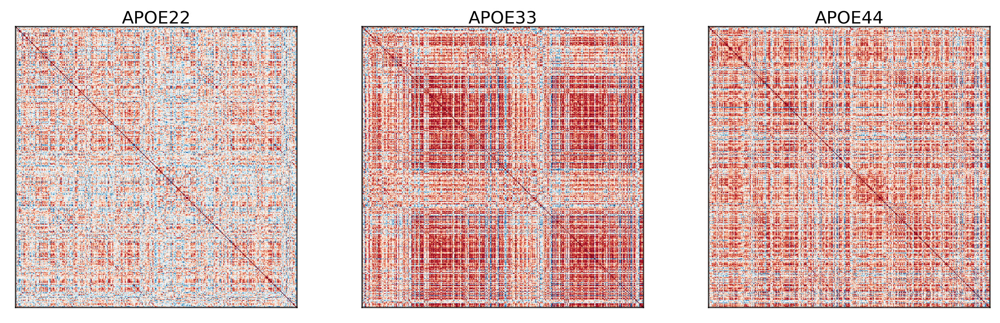

In [17]:
## Plot to make sure nothing is wrong
fig, ax = plt.subplots(
    ncols=3,
    figsize=(10, 3),
    constrained_layout=True,
    dpi=300,
    gridspec_kw=dict(width_ratios=[1, 1, 1]),
)

for i in range(len(correlations)):
    gp.plot.adjplot(
        correlations[i],
        ax=ax[i],
        vmin=-1,
        vmax=1,
        meta=vertex_name,
        #group=["Hemisphere_abbrev"],
    )
    ax[i].set_title(f"{GENOTYPES[i]}", pad=0, size=12)

## Embed the data simultaneously using Omnibus embedding

The purpose of omnibus embedding is to obtain a low dimensional representation of the three correlation matrices such that the embedded correlation matrices can be compared to each other in a meaningful way {cite:p}`Athreya2018-zp,ase-consistency-1,ase-consistency-2,ase-consistency-3`. The embedding provides a low dimensional vector per region of the brain for each correlation matrix, resulting in a $322\times d$ matrix per genotype where $d$ is the "embedding dimension" and $d << 332$. The resulting vectors per region is called a latent positions of a vertex. Omnibus embedding is similar to the idea of using PCA on data to get dataset with reduced number of features. 

We will use the embeddings in order to perform hierchical clustering {cite:p}`athey2019autogmm`.

In [9]:
omni = gp.embed.OmnibusEmbed()
Xhats = omni.fit_transform([corr for _, corr in cor_dat.items()])

print(omni.n_components_)

4


The automated algorithm chooses $d$ for us, which in this case is $d=4$.

## Perform hierarchical clustering

First we concatenate the embeddings resulting in a matrix with size $332 \times 3d$. We will iteratively divide the regions into two clusters. For example, we divide the $332$ regions into two clusters, and each resulting cluster will be divided into two more clusters, etc. The clustering algorithm used at each division is Gaussian mixture modeling {cite:p}`athey2019autogmm`.

The clustering algorithm will tell us which regions should be grouped together, and subsequently forms our "subgraphs" given by the clusterings. 

In [10]:
cluster = gp.cluster.DivisiveCluster(max_level=3)

cluster_labels = cluster.fit_predict(np.hstack(Xhats), fcluster=True)

cluster_label_df = pd.DataFrame(
    cluster_labels, columns=["cluster_level_1", "cluster_level_2", "cluster_level_3"]
)

## Plotting the cluster labeling along with apriori labels using Sankey diagrams

Sankey diagrams tell us which regions or subregions belong to which clusters.

In [11]:
def count_groups(label_matrix):
    levels = label_matrix.shape[1] - 1
    d = []

    for level in range(levels):
        upper_cluster_ids = np.unique(label_matrix[:, level])

        for upper_cluster_id in upper_cluster_ids:
            lower_cluster_ids, counts = np.unique(
                label_matrix[label_matrix[:, level] == upper_cluster_id][:, level + 1],
                return_counts=True,
            )

            for idx, lower_cluster_id in enumerate(lower_cluster_ids):
                d.append((upper_cluster_id, lower_cluster_id, counts[idx]))

    d = np.array(d)

    source = d[:, 0]
    target = d[:, 1]
    value = d[:, 2]

    return source, target, value


def append_apriori_labels(apriori_labels, cluster_matrix):
    encoder = LabelEncoder()
    apriori_labels_encoded = encoder.fit_transform(apriori_labels)
    apriori_labels_encoded = apriori_labels_encoded.reshape(-1, 1)

    # Increase the original cluster_matrix labels
    cluster_matrix_ = cluster_matrix + np.max(apriori_labels_encoded) + 1

    out = np.hstack([apriori_labels_encoded, cluster_matrix_])

    return out, list(encoder.classes_)


hemispheric_clusters, encoded_labels = append_apriori_labels(node_labels.Hemisphere, cluster_labels)

source, target, value = count_groups(hemispheric_clusters)

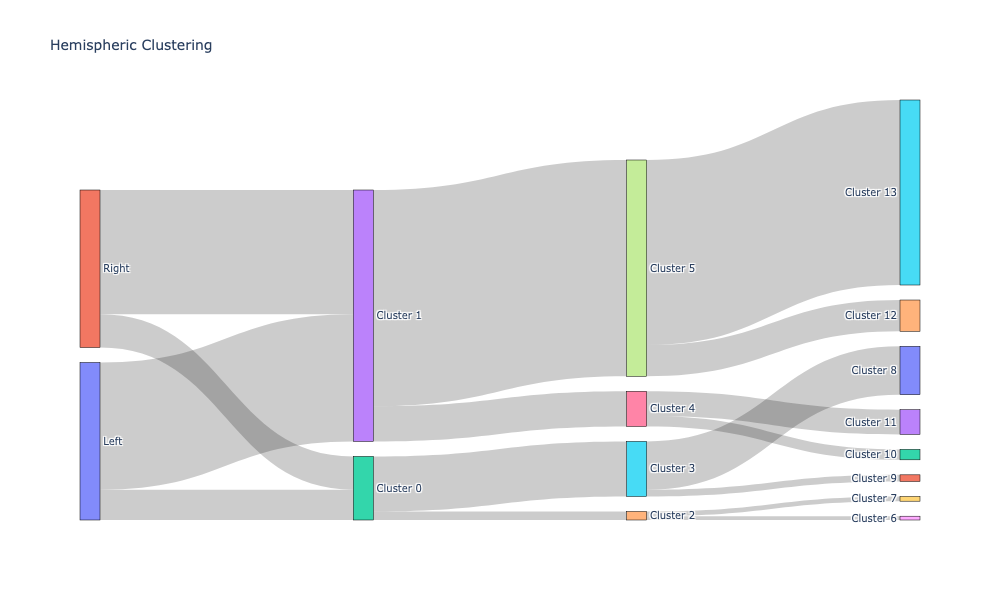

In [12]:
fig = go.Figure(
    data=[
        go.Sankey(
            node=dict(
                pad=15,
                thickness=20,
                line=dict(color="black", width=0.5),
                label=encoded_labels
                + [f"Cluster {i}" for i in range(np.max(hemispheric_clusters))],
            ),
            link=dict(source=source, target=target, value=value),
        )
    ]
)

fig.update_layout(title_text="Hemispheric Clustering", font_size=10)
fig.show(dpi=300, width=1000, height=600)

In [13]:
level_1_clusters, encoded_labels = append_apriori_labels(node_labels.Level_1, cluster_labels)

source, target, value = count_groups(level_1_clusters)

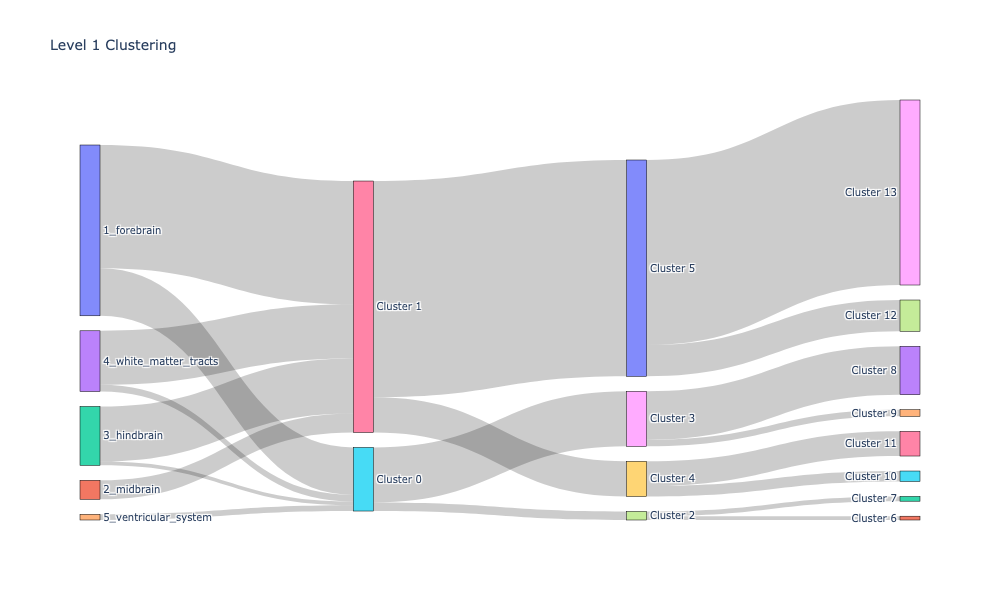

In [14]:
fig = go.Figure(
    data=[
        go.Sankey(
            node=dict(
                pad=15,
                thickness=20,
                line=dict(color="black", width=0.5),
                label=encoded_labels + [f"Cluster {i}" for i in range(np.max(level_1_clusters[0]))],
            ),
            link=dict(source=source, target=target, value=value),
        )
    ]
)

fig.update_layout(title_text="Level 1 Clustering", font_size=10)
fig.show(dpi=300, width=1000, height=600)

## Visualizing different clustering levels using heatmaps

Heatmaps can qualitatively tell us if there are any underlying structures within the clusters.

In [15]:
cl = pd.DataFrame(cluster_labels, columns=[f"Cluster_{i}" for i in range(1, 4)])

meta = pd.concat([node_labels, cl], axis=1)

meta.head()

,Structure,Abbreviation,Hemisphere,Level_1,Level_2,Level_3,Level_4,Subdivisions_7,index,index2,clusfound,Subdivisions_7_nowm,Hemisphere_abbrev,Level_1_abbrev,Cluster_1,Cluster_2,Cluster_3
0,Cingulate_Cortex_Area_24a,A24a,Left,1_forebrain,1_secondary_prosencephalon,1_isocortex,2_cingulate_cortex,1_isocortex,1,1.0,0,1_isocortex,L,F,1,5,13
1,Cingulate_Cortex_Area_24a_prime,A24aPrime,Left,1_forebrain,1_secondary_prosencephalon,1_isocortex,2_cingulate_cortex,1_isocortex,2,2.0,0,1_isocortex,L,F,0,3,9
2,Cingulate_Cortex_Area_24b,A24b,Left,1_forebrain,1_secondary_prosencephalon,1_isocortex,2_cingulate_cortex,1_isocortex,3,3.0,0,1_isocortex,L,F,0,3,8
3,Cingulate_Cortex_Area_24b_prime,A24bPrime,Left,1_forebrain,1_secondary_prosencephalon,1_isocortex,2_cingulate_cortex,1_isocortex,4,4.0,0,1_isocortex,L,F,0,3,8
4,Cingulate_Cortex_Area_29a,A29a,Left,1_forebrain,1_secondary_prosencephalon,1_isocortex,2_cingulate_cortex,1_isocortex,5,5.0,0,1_isocortex,L,F,1,5,13


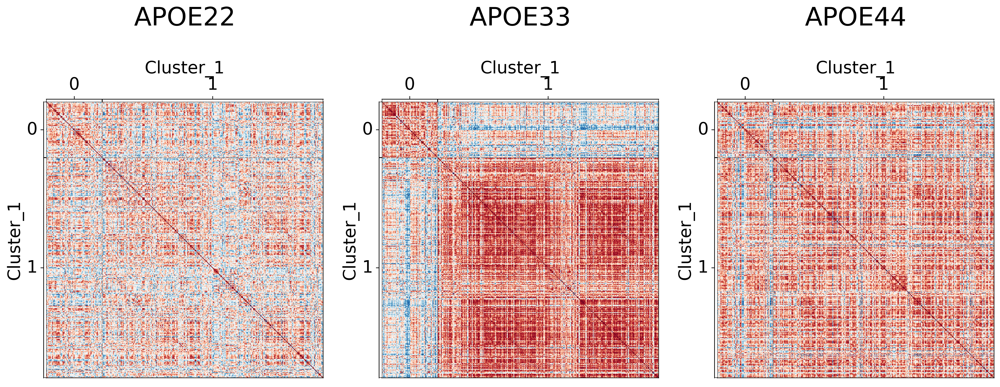

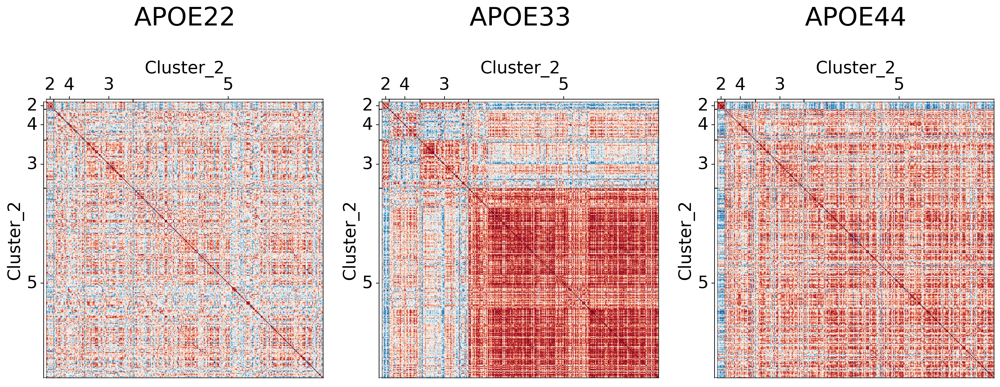

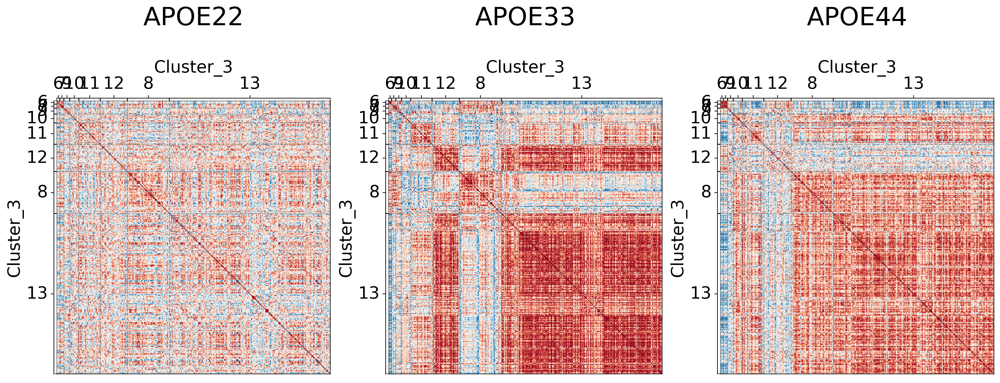

In [16]:
## Plot to make sure nothing is wrong
for l in range(3):
    fig, ax = plt.subplots(
        ncols=3,
        figsize=(20, 10),
        # constrained_layout=True,
        dpi=300,
        gridspec_kw=dict(width_ratios=[1, 1, 1]),
    )

    for (i, genotype) in enumerate(cor_dat.keys()):
        gp.plot.adjplot(
            cor_dat[genotype],
            ax=ax[i],
            vmin=-1,
            vmax=1,
            meta=meta,
            group=[f"Cluster_{l+1}"],
        )
        ax[i].set_title(f"{genotype}", pad=90, size=30)

    # fig.savefig(f"./figures/2022-02-02-multigraph-clustering-level-{l + 1}.png", bbox_inches='tight')

It seems like cluster structures are predominantly driven by the large correlations in the APOE3 genotype

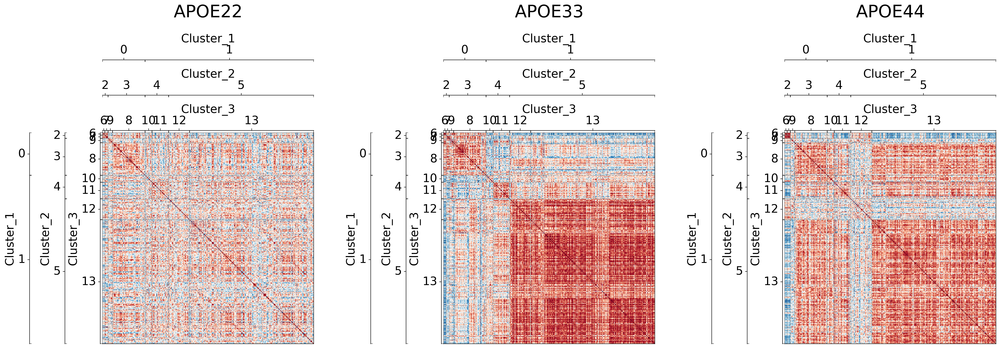

In [17]:
## Plot to make sure nothing is wrong
fig, ax = plt.subplots(
    ncols=3,
    figsize=(30, 20),
    # constrained_layout=True,
    dpi=300,
    gridspec_kw=dict(width_ratios=[1, 1, 1]),
)

for (i, genotype) in enumerate(cor_dat.keys()):
    gp.plot.adjplot(
        cor_dat[genotype],
        ax=ax[i],
        vmin=-1,
        vmax=1,
        meta=meta,
        group=["Cluster_1", "Cluster_2", "Cluster_3"],
    )
    ax[i].set_title(f"{genotype}", pad=200, size=30)

# fig.savefig(f"./figures/2022-02-02-multigraph-clustering-level-all.png", bbox_inches='tight')

## Testing for significantly different clusters at various levels

Again, the clusters tell us which regions should be grouped together. Hence, each cluster forms our subgraph. For each subgraph, we test whether the distribution of the latent positions (aka the embeddings) are significantly different. Specifically we test 

\begin{align}
H_0:& \qquad F_{APOE2}=F_{APOE3}=F_{APOE4}\\
H_A:& \qquad \text{At least one pair of distributions is different}
\end{align}

using a 3-sample distance correlation. We correct for multiple hypothesis testing via Holm-Bonferroni correction.

In [18]:
def holm_bonferroni(pvals, alpha=0.05):
    sorted_pvals = np.sort(pvals)

    m = len(pvals)
    corrected_alpha = alpha / m

    for i in range(m):
        if sorted_pvals[i] < corrected_alpha:
            corrected_alpha = alpha / (m + 1 - (i + 2))
        else:
            break

    return corrected_alpha

In [19]:
res = []

for level in range(cluster_labels.shape[1]):
    level_labels = cluster_labels[:, level]
    uniques = np.unique(level_labels)

    for cluster in uniques:
        idx = level_labels == cluster

        data = [Xhat[idx] for Xhat in Xhats]

        ksample = hyppo.ksample.KSample("dcorr")
        stat, pval = ksample.test(*data)

        res.append((level, cluster, pval))

ksample_df = pd.DataFrame(res, columns=["Cluster_level", "Cluster_id", "pval"])

corrected_alpha = holm_bonferroni(ksample_df.pval)

ksample_df["significant"] = ksample_df.pval < corrected_alpha

### Ksample testing results

We see that most clusters are significantly different.

In [20]:
ksample_df

,Cluster_level,Cluster_id,pval,significant
0,0,0,6.436563e-05,True
1,0,1,4.461111e-31,True
2,1,2,1.323931e-03,True
3,1,3,2.424141e-05,True
4,1,4,2.602857e-02,False
5,1,5,9.255344e-33,True
6,2,6,9.990010e-04,True
7,2,7,4.995005e-03,True
8,2,8,1.919761e-06,True
9,2,9,2.317542e-01,False


### Testing for differences in pairwise subgraph covariances

The test above tells us whether a pair, or all, genotypes are different. For example, a significant result may mean that APOE2 and APOE3 are different. However, it is also possible that APOE2, APOE3, and APOE4 are all different. To figure out which pairs are different, we do a post-hoc pairwise test. That is, for each cluster (aka subgraph), we test whether each pair of genotypes are different. Specifically,

\begin{align}
H_0:& \qquad F_{i}=F_{j}\\
H_A:& \qquad F_i \neq F_j
\end{align}

where $i, j$ denotes a particular genotype. Again, we use distance correlation with Holm-Bonferroni correction.

In [21]:
genotypes = ["APOE22", "APOE33", "APOE44"]

ksample = hyppo.ksample.KSample("dcorr")

res = []

cluster_df = ksample_df[ksample_df.significant == True]

for _, row in cluster_df.iterrows():
    cluster_id = row.Cluster_id
    idx = cluster_labels[:, row.Cluster_level] == cluster_id

    cluster_Xhat = [Xhat[idx] for Xhat in Xhats]

    for i, g in enumerate(genotypes):
        for j, h in enumerate(genotypes):
            if i < j:
                continue
            if g == h:
                # res.append([cluster_id, g, h, 1])
                continue
            else:
                ksample = hyppo.ksample.KSample("dcorr")

                _, pval = ksample.test(cluster_Xhat[i], cluster_Xhat[j])
                res.append([row.Cluster_level, cluster_id, g, h, pval])

res = pd.DataFrame(res, columns=["cluster_level", "cluster_id", "Genotype_1", "Genotype_2", "pval"])
res["log(pval)"] = np.log(res.pval)

In [22]:
corrected_alpha = holm_bonferroni(res.pval)

res["significant"] = res.pval < corrected_alpha

In [23]:
from scipy.spatial.distance import squareform

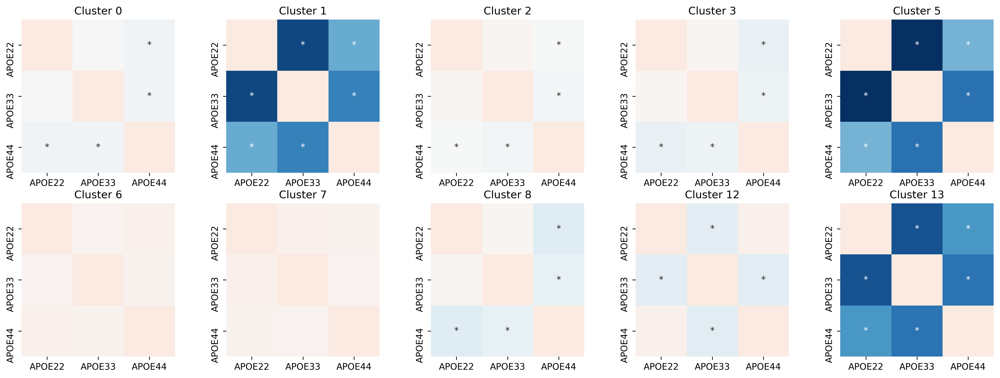

In [24]:
fig, ax = plt.subplots(ncols=5, nrows=2, figsize=(20, 7), dpi=300)

ax = ax.ravel()

for i, cluster_id in enumerate(np.unique(res.cluster_id)):
    tmp = res[res.cluster_id == cluster_id]
    data = squareform(tmp["log(pval)"])
    sig_labels = squareform(["*" if sig is True else "" for sig in tmp.significant])
    sns.heatmap(
        data,
        annot=sig_labels,
        fmt="",
        vmax=0,
        vmin=np.min(res["log(pval)"]),
        xticklabels=genotypes,
        yticklabels=genotypes,
        center=np.log(corrected_alpha),
        cmap="RdBu_r",
        square=True,
        ax=ax[i],
        cbar=False,
    )
    ax[i].set_title(f"Cluster {cluster_id}")

We see that for some clusters, each pair is not significant. For example, none of the pairs in cluster 10 and 11 are significantly different. However, we see certain clusters, such as cluster 5 and 8, only certain pairs of genotypes are significantly different. The * indicates a significant result.

In [ ]:
# out = pd.concat([node_labels, cluster_label_df], axis=1)

# out.to_csv("../outs/omni_clustering.csv", index=False)

```{bibliography}
:filter: docname in docnames
```